In [1]:
import squidpy as sq
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scanpy as sc

In [90]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(5, 5))

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                         8.1.0
PyQt5                       NA
affine                      2.3.0
anndata                     0.7.5
appdirs                     1.4.4
asciitree                   NA
attr                        20.3.0
backcall                    0.2.0
brotli                      NA
bs4                         4.9.3
cairo                       1.20.0
certifi                     2020.12.05
cffi                        1.14.5
chardet                     4.0.0
click                       7.1.2
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
dask                        2021.02.0
dateutil                    2.8.1
decorator                   4.4.2
docrep                      0.3.2
docstring_parser            NA
esda                        2.3.6
fasteners                   NA
get_version                 2.1
h5py                        3.1.0
idna                   

In [60]:
chicken_visium = sc.read("./../pyobjs/chicken_spatialRNAseq.h5ad")

In [62]:
day14_visium = sc.read("./../pyobjs/day14_spatialRNAseq.h5ad")

In [63]:
chicken_visium.obs[chicken_visium.obs["sample"] == "D14-D1"]

,in_tissue,array_row,array_col,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,clusters,orig.ident,...,TMSB4X.high.cells,Epi-mesenchymal.cells,Dendritic.cells,Mural.cells,max,celltype_prediction_max,celltype_prediction,celltype_prediction_mode,region,seurat_cellname
AAACAAGTATCTCCCA-1-D14-D1,1,50,102,D14-D1,2446,13254.0,2555.0,19.277199,5,D14,...,0.023730,0.000000,0,0.000000,0.291200,MT-enriched cardiomyocytes,Immature myocardial cells,Erythrocytes,Atria,D14-D1_AAACAAGTATCTCCCA-1
AAACATTTCCCGGATT-1-D14-D1,1,61,97,D14-D1,2439,14259.0,3407.0,23.893681,5,D14,...,0.037476,0.000000,0,0.000000,0.369797,Cardiomyocytes-1,Immature myocardial cells,Vascular endothelial cells,Atria,D14-D1_AAACATTTCCCGGATT-1
AAACCCGAACGAAATC-1-D14-D1,1,45,115,D14-D1,1856,6800.0,975.0,14.338236,7,D14,...,0.042678,0.011129,0,0.021135,0.752036,Fibroblast cells,Fibroblast cells,Fibroblast cells,Epicardium,D14-D1_AAACCCGAACGAAATC-1
AAACCGTTCGTCCAGG-1-D14-D1,1,52,42,D14-D1,2090,10725.0,2275.0,21.212122,0,D14,...,0.024527,0.000000,0,0.000000,0.397038,Vascular endothelial cells,Cardiomyocytes-1,Cardiomyocytes-1,Compact LV and \ninter-ventricular septum,D14-D1_AAACCGTTCGTCCAGG-1
AAACCTAAGCAGCCGG-1-D14-D1,1,65,83,D14-D1,1980,9931.0,1544.0,15.547276,5,D14,...,0.004331,0.000000,0,0.000000,0.958324,Erythrocytes,Erythrocytes,Erythrocytes,Atria,D14-D1_AAACCTAAGCAGCCGG-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTTTCCCGAAAG-1-D14-D1,1,51,59,D14-D1,2849,15129.0,1961.0,12.961862,7,D14,...,0.000000,0.117749,0,0.032358,0.555955,Fibroblast cells,Fibroblast cells,Fibroblast cells,Valves,D14-D1_TTGTGTTTCCCGAAAG-1
TTGTTAGCAAATTCGA-1-D14-D1,1,22,42,D14-D1,1781,8408.0,1733.0,20.611322,0,D14,...,0.017630,0.000000,0,0.000000,0.588776,Immature myocardial cells,Cardiomyocytes-1,Cardiomyocytes-1,Compact LV and \ninter-ventricular septum,D14-D1_TTGTTAGCAAATTCGA-1
TTGTTCAGTGTGCTAC-1-D14-D1,1,24,64,D14-D1,2482,12109.0,1630.0,13.461062,0,D14,...,0.231844,0.000000,0,0.000000,0.383047,Immature myocardial cells,Cardiomyocytes-1,Cardiomyocytes-1,Trabecular LV and \nendocardium,D14-D1_TTGTTCAGTGTGCTAC-1
TTGTTGTGTGTCAAGA-1-D14-D1,1,31,77,D14-D1,1741,7822.0,1549.0,19.803120,0,D14,...,0.032034,0.000000,0,0.000000,0.867228,Cardiomyocytes-1,Cardiomyocytes-1,Cardiomyocytes-1,Compact LV and \ninter-ventricular septum,D14-D1_TTGTTGTGTGTCAAGA-1


In [64]:
day14_metadata = chicken_visium.obs[chicken_visium.obs["sample"] == "D14-D1"]
day14_metadata.drop(day14_metadata.columns[[0, 1, 2]], axis = 1, inplace = True) 
day14_metadata.index = day14_visium.obs_names

/home/mm2937/.local/lib/python3.8/site-packages/pandas/core/frame.py:4305: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [65]:
day14_visium.obs = day14_visium.obs.join(day14_metadata)

In [66]:
day14_visium.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,clusters,orig.ident,...,TMSB4X.high.cells,Epi-mesenchymal.cells,Dendritic.cells,Mural.cells,max,celltype_prediction_max,celltype_prediction,celltype_prediction_mode,region,seurat_cellname
AAACAAGTATCTCCCA-1,1,50,102,D14-D1,2446,13254.0,2555.0,19.277199,5,D14,...,0.023730,0.000000,0,0.000000,0.291200,MT-enriched cardiomyocytes,Immature myocardial cells,Erythrocytes,Atria,D14-D1_AAACAAGTATCTCCCA-1
AAACATTTCCCGGATT-1,1,61,97,D14-D1,2439,14259.0,3407.0,23.893681,5,D14,...,0.037476,0.000000,0,0.000000,0.369797,Cardiomyocytes-1,Immature myocardial cells,Vascular endothelial cells,Atria,D14-D1_AAACATTTCCCGGATT-1
AAACCCGAACGAAATC-1,1,45,115,D14-D1,1856,6800.0,975.0,14.338236,7,D14,...,0.042678,0.011129,0,0.021135,0.752036,Fibroblast cells,Fibroblast cells,Fibroblast cells,Epicardium,D14-D1_AAACCCGAACGAAATC-1
AAACCGTTCGTCCAGG-1,1,52,42,D14-D1,2090,10725.0,2275.0,21.212122,0,D14,...,0.024527,0.000000,0,0.000000,0.397038,Vascular endothelial cells,Cardiomyocytes-1,Cardiomyocytes-1,Compact LV and \ninter-ventricular septum,D14-D1_AAACCGTTCGTCCAGG-1
AAACCTAAGCAGCCGG-1,1,65,83,D14-D1,1980,9931.0,1544.0,15.547276,5,D14,...,0.004331,0.000000,0,0.000000,0.958324,Erythrocytes,Erythrocytes,Erythrocytes,Atria,D14-D1_AAACCTAAGCAGCCGG-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTTTCCCGAAAG-1,1,51,59,D14-D1,2849,15129.0,1961.0,12.961862,7,D14,...,0.000000,0.117749,0,0.032358,0.555955,Fibroblast cells,Fibroblast cells,Fibroblast cells,Valves,D14-D1_TTGTGTTTCCCGAAAG-1
TTGTTAGCAAATTCGA-1,1,22,42,D14-D1,1781,8408.0,1733.0,20.611322,0,D14,...,0.017630,0.000000,0,0.000000,0.588776,Immature myocardial cells,Cardiomyocytes-1,Cardiomyocytes-1,Compact LV and \ninter-ventricular septum,D14-D1_TTGTTAGCAAATTCGA-1
TTGTTCAGTGTGCTAC-1,1,24,64,D14-D1,2482,12109.0,1630.0,13.461062,0,D14,...,0.231844,0.000000,0,0.000000,0.383047,Immature myocardial cells,Cardiomyocytes-1,Cardiomyocytes-1,Trabecular LV and \nendocardium,D14-D1_TTGTTCAGTGTGCTAC-1
TTGTTGTGTGTCAAGA-1,1,31,77,D14-D1,1741,7822.0,1549.0,19.803120,0,D14,...,0.032034,0.000000,0,0.000000,0.867228,Cardiomyocytes-1,Cardiomyocytes-1,Cardiomyocytes-1,Compact LV and \ninter-ventricular septum,D14-D1_TTGTTGTGTGTCAAGA-1


In [67]:
#day14_visium.write('./../pyobjs/day14_spatialRNAseq.h5ad')
#day14_visium = sc.read("./../pyobjs/day14_spatialRNAseq.h5ad")

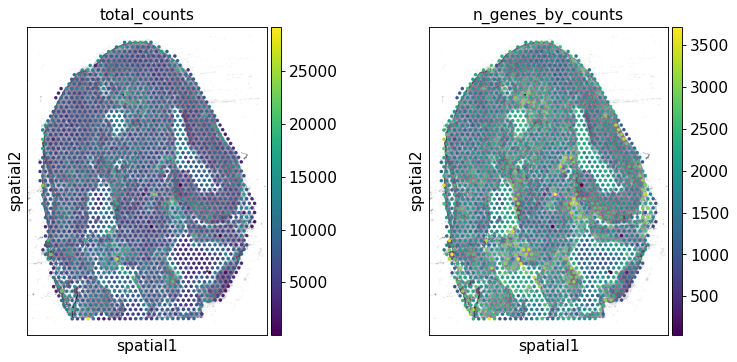

In [91]:
sc.pl.spatial(day14_visium, img_key="hires", color=["total_counts", "n_genes_by_counts"],
        size=1.0, legend_loc=None)

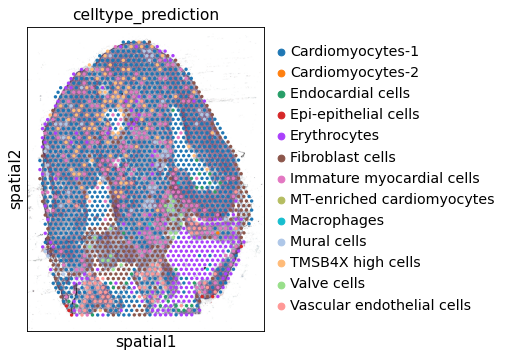

In [92]:
sc.pl.spatial(day14_visium, img_key="hires", color=["celltype_prediction"], size=1.0)

In [73]:
day14_img = sq.im.ImageContainer("./../chicken_visium_stiched_images_round2//D1/D1.tif")

In [283]:
L1_img = sq.im.ImageContainer("./ImageProcessingFiles/L1.tif", layer="image")
L1_img.show()

Adding image layer `image`


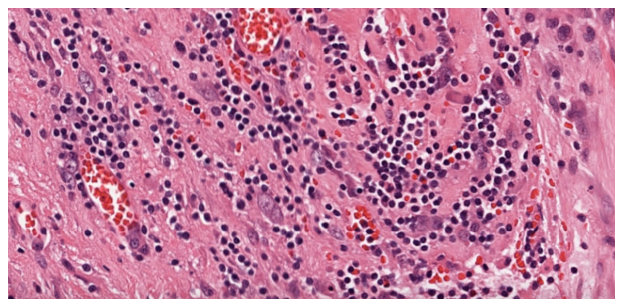

In [162]:
crop_corner = day14_img.crop_corner(8000, 8000, size = 1000)
crop_corner = day14_img.crop_corner(12000, 12000, size = 1000)

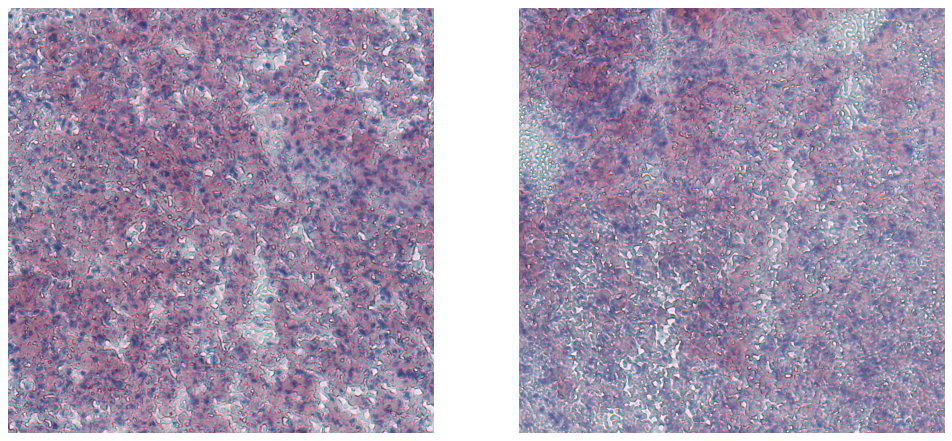

In [335]:
crop_corner1 = day14_img.crop_corner(8000, 8000, size = 1000)
crop_corner2 = day14_img.crop_corner(12000, 12000, size = 1000)
fig, axes = plt.subplots(1, 2, figsize = (15,15))
crop_corner1.show(ax=axes[0])
crop_corner2.show(ax=axes[1])

In [174]:
import pylab as pl
import re
import numpy as np
import scipy as sp
import scipy.ndimage
import pandas as pd
import base64
import io
import colorsys
import random
import skimage.io
import skimage.measure
import skimage.color

In [256]:
import max_clustering as mc

In [192]:
def reinhard_array(img):
    refimg = skimage.io.imread("/fs/cbsuvlaminck3/workdir/mm2937/ImageProcessingFiles/L1.png")[:, :, :3]
    im_lab = mc.rgb_to_lab(refimg)
    target_mu = np.zeros(3)
    target_sigma = np.zeros(3)
    src_mu = np.zeros(3)
    src_sigma = np.zeros(3)

    for i in range(3):
        target_mu[i] = im_lab[:, :, i].mean()
        target_sigma[i] = (im_lab[:, :, i] - target_mu[i]).std()

    im_lab = mc.rgb_to_lab(img)
    for i in range(3):
        src_mu[i] = im_lab[:, :, i].mean()
        src_sigma[i] = (im_lab[:, :, i] - src_mu[i]).std()

    for i in range(3):
        im_lab[:, :, i] = (im_lab[:, :, i] - src_mu[i]) / src_sigma[i] * target_sigma[i] + target_mu[i]

    im_norm = mc.lab_to_rgb(im_lab)
    im_norm[im_norm > 255] = 255
    im_norm[im_norm < 0] = 0
    im_norm = im_norm.astype(np.uint8)

    return im_norm

In [341]:
crop_corner1.add_img(reinhard_array(skimage.img_as_uint(crop_corner1["image"])), layer= "image_reinhard")
crop_corner2.add_img(reinhard_array(skimage.img_as_uint(crop_corner2["image"])), layer= "image_reinhard")

Adding image layer `image_reinhard`
Adding image layer `image_reinhard`


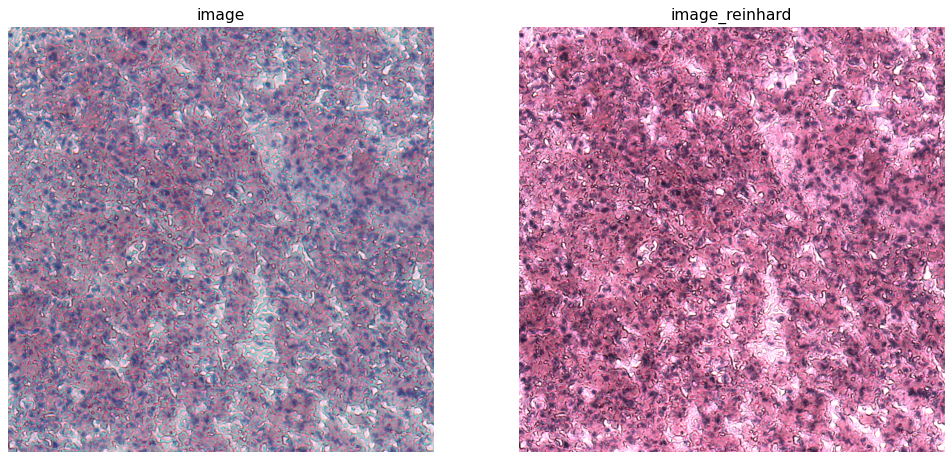

In [342]:
fig, axes = plt.subplots(1, 2, figsize = (15,15))
for layer, ax in zip(["image", "image_reinhard"], axes):
    crop_corner1.show(layer, ax=ax)
    ax.set_title(layer)

In [426]:
from skimage.exposure import match_histograms
from skimage.exposure import rescale_intensity

matched = match_histograms(skimage.img_as_uint(crop_corner1["image_reinhard"]), skimage.img_as_uint(L1_img["image"]), multichannel=True)
matched = rescale_intensity(matched, out_range = (0., 1.))


Overwriting image layer `hmatched`


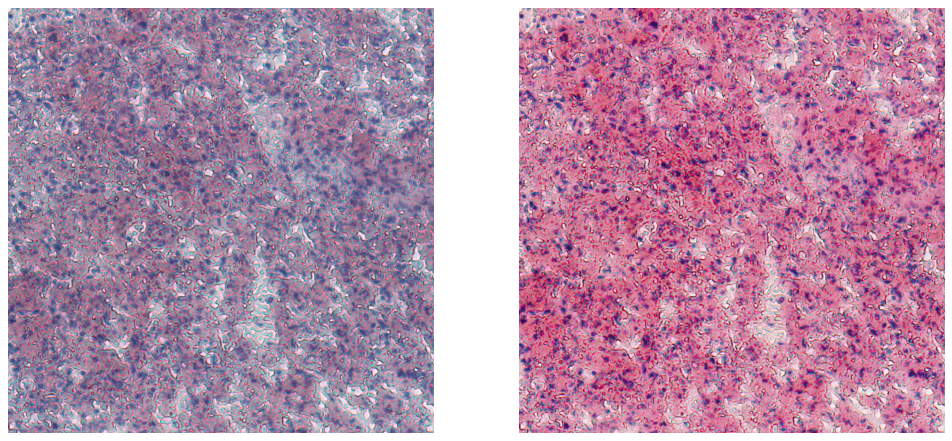

In [390]:
crop_corner1.add_img(matched, layer="hmatched")
fig, axes = plt.subplots(1, 2, figsize = (15,15))
crop_corner1.show(layer = "image", ax=axes[0])
crop_corner1.show(layer = "hmatched", ax=axes[1])

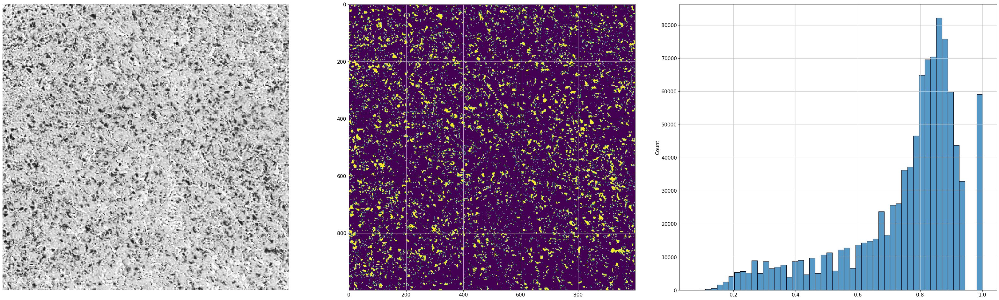

In [407]:
fig, axes = plt.subplots(1, 3, figsize=(40, 12))
crop_corner1.show(layer="hmatched", channel = 0, cmap = "gray", ax=axes[0])
axes[1].imshow(crop_corner1["hmatched"][:, :, 0] < 0.50)
_ = sns.histplot(np.array(crop_corner1["hmatched"][:,:,0]).flatten(), bins=50, ax=axes[2])
plt.tight_layout()

In [429]:
# smooth image
sq.im.process(L1_img, layer="image", method="smooth", sigma=3)
sq.im.process(crop_corner1, layer="hmatched", method="smooth", sigma=3)
sq.im.process(crop_corner1, layer="image_reinhard", method="smooth", sigma=3)

Processing image using `smooth` method
Adding image layer `image`
Finish (0:00:00)
Overwriting image layer `image_smooth`
Processing image using `smooth` method
Adding image layer `hmatched`
Finish (0:00:00)
Overwriting image layer `hmatched_smooth`
Processing image using `smooth` method
Adding image layer `image_reinhard`
Finish (0:00:00)
Overwriting image layer `image_reinhard_smooth`


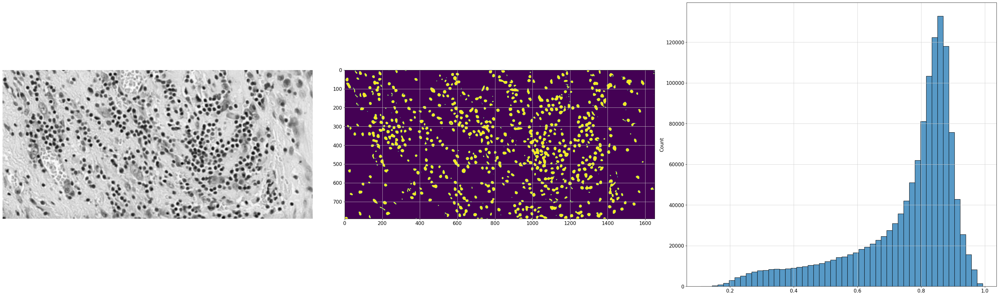

In [403]:
fig, axes = plt.subplots(1, 3, figsize=(40, 12))
L1_img.show(layer="image_smooth", channel = 0, cmap = "gray", ax=axes[0])
axes[1].imshow(L1_img["image_smooth"][:, :, 0] < 0.50)
_ = sns.histplot(np.array(L1_img["image_smooth"][:, :, 0]).flatten(), bins=50, ax=axes[2])
plt.tight_layout()

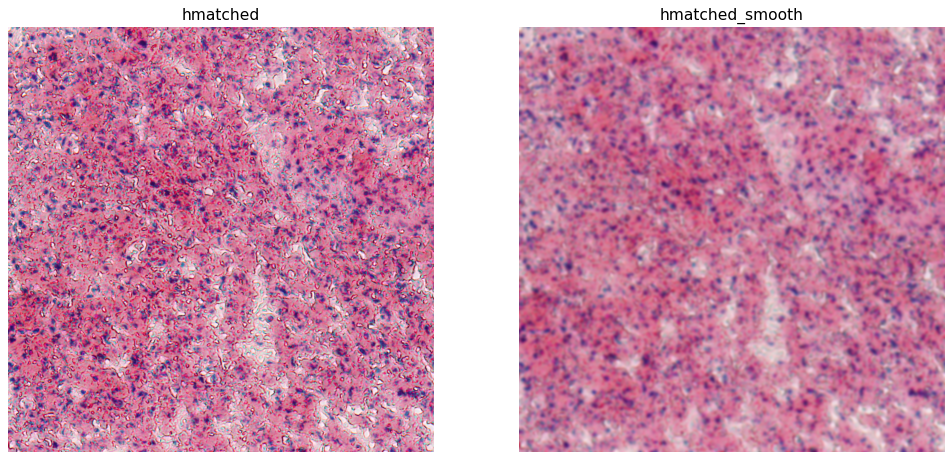

In [430]:
fig, axes = plt.subplots(1, 2, figsize = (15,15))
for layer, ax in zip(["hmatched", "hmatched_smooth"], axes):
    crop_corner1.show(layer, ax=ax)
    ax.set_title(layer)

Processing image using `gray` method
Adding image layer `hmatched_smooth`
Finish (0:00:00)
Overwriting image layer `hmatched_smooth_gray`


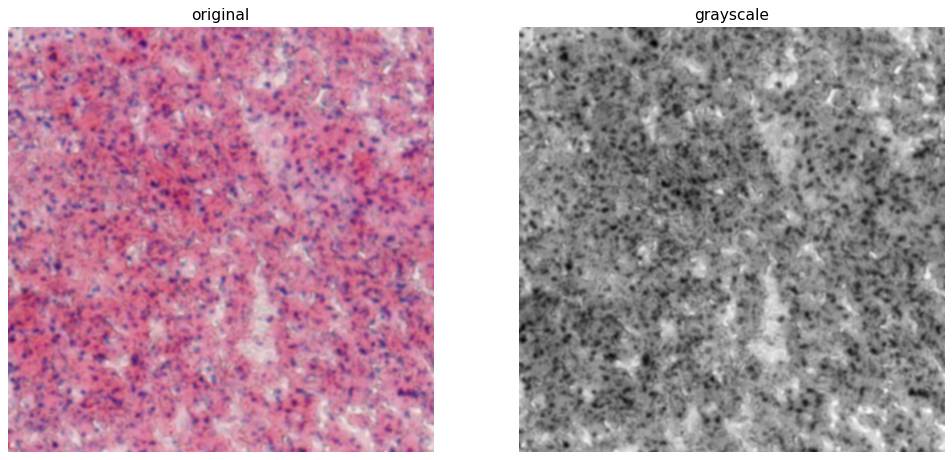

In [444]:
sq.im.process(crop_corner1, layer="hmatched_smooth", method="gray")
fig, axes = plt.subplots(1, 2, figsize = (15,15))
crop_corner1.show("hmatched_smooth", ax=axes[0])
_ = axes[0].set_title("original")
crop_corner1.show("hmatched_smooth_gray", cmap="gray", ax=axes[1])
_ = axes[1].set_title("grayscale")

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(40, 12))
crop_corner1.show(layer="hmatched_smooth", channel=0 , cmap = "gray", ax=axes[0])
axes[1].imshow(crop_corner1["hmatched_smooth"][:, :, 0] < 0.50)
_ = sns.histplot(np.array(crop_corner1["hmatched_smooth"][:,:,0]).flatten(), bins=50, ax=axes[2])
plt.tight_layout()

In [473]:
from skimage.filters import threshold_otsu, rank
from skimage.util import img_as_ubyte
from skimage.morphology import disk
import matplotlib
import matplotlib.pyplot as plt

img = skimage.img_as_float(crop_corner1["hmatched_smooth"][:,:,0])

radius = 500
selem = disk(radius)
local_otsu = rank.otsu(img, selem)
threshold_global_otsu = threshold_otsu(img)
global_otsu = img >= threshold_global_otsu

/home/mm2937/miniconda3/envs/python385/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3427: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [436]:
sq.im.segment(img=crop_corner1, layer="hmatched_smooth", method="watershed", thresh=0.60, geq=False)

Segmenting `1` crops using `SegmentationWatershed` and `1` core(s)
Adding image layer `hmatched_smooth`
Finish (0:00:01)
Overwriting image layer `segmented_watershed`


ImageContainer[shape=(1000, 1000), layers=['hequalized', 'himage_reinhard', 'hmatched', 'hmatched_smooth', 'hmatched_smooth_gray', 'image', 'image_reinhard', 'image_reinhard_smooth', 'image_reinhard_smooth_gray', 'reinhard_hmatched', 'segmented_watershed']]
number of segments in crop: 1440


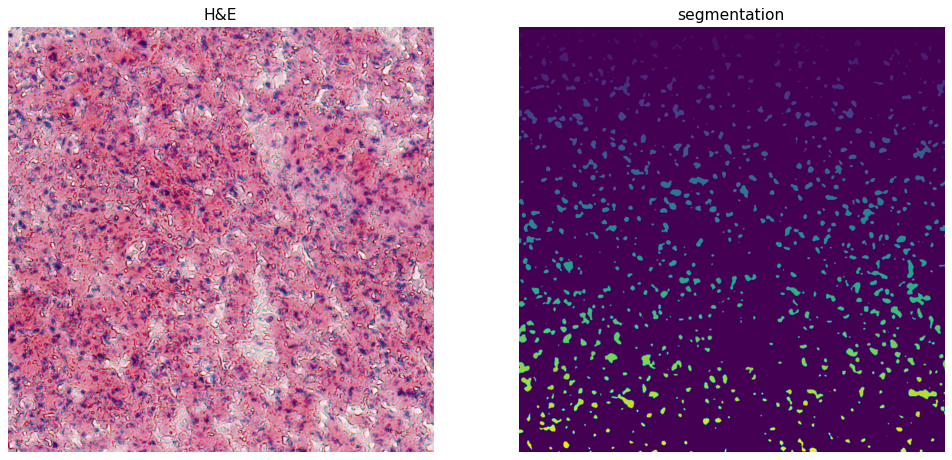

In [438]:
print(crop_corner1)
print(f"number of segments in crop: {len(np.unique(crop_corner1['segmented_watershed']))}")

fig, axes = plt.subplots(1, 2, figsize = (15,15))
crop_corner1.show("hmatched", ax=axes[0])
_ = axes[0].set_title("H&E")
crop_corner1.show("segmented_watershed", ax=axes[1])
_ = axes[1].set_title("segmentation")